In [1]:
import numpy as np
import xarray as xr
import os
import fnmatch
from tqdm.autonotebook import tqdm
import dask
import sys
sys.path.insert(0, '/home/jovyan/CMIP6cf/cmip6cf/')
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%config InlineBackend.figure_format = 'retina'


/tmp/ipykernel_1314/3363248783.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Load output:

In [2]:
in_dir = '/home/jovyan/CMIP6cf/output/surge_pr_dependence/40yr_p97'
output_files = []
for root, dirs, files in os.walk(in_dir, topdown=False):
    for name in files:
        output_files.append(os.path.join(root, name))
ssps = ['ssp245','ssp585']
for s,ssp in enumerate(ssps):
    ssp_ds = xr.open_mfdataset(fnmatch.filter(output_files,'*'+ssp+'*'),concat_dim='source_id',combine='nested',coords='minimal',compat='override',join='outer')
    ssp_ds = ssp_ds.assign_coords({'source_id':[s.split('/')[7] for s in fnmatch.filter(output_files,'*'+ssp+'*')]})
    if s==0:
        ds = ssp_ds
    else:
        ds = xr.concat((ds,ssp_ds),dim='ssp',coords='minimal',compat='override',join='outer')
ds = ds.assign_coords({'ssp':ssps})

In [3]:
complete = ds.complete_window.sel(window=slice(1970,2100)).sum(dim='window')==len(ds.complete_window.sel(window=slice(1970,2100)).window)
ds = ds.where(complete) #require runs to be complete from 1970 to 2100
ds = ds.sel(window=slice(1970,2100))

In [4]:
timesteps = xr.DataArray(data=np.arange(len(ds.window)),dims=['window'],coords=dict(window=ds.window))

ds['ktau_slope'] = (1/np.diff(ds.window)[0])*xr.corr(ds.ktau,timesteps,dim='window')*ds.ktau.std(dim='window')/timesteps.std(dim='window')
ds['utdc_slope'] = (1/np.diff(ds.window)[0])*xr.corr(ds.utdc,timesteps,dim='window')*ds.utdc.std(dim='window')/timesteps.std(dim='window')

ds['surge_thresholds_slope'] = (1/np.diff(ds.window)[0])*xr.corr(ds.surge_thresholds,timesteps,dim='window')*ds.surge_thresholds.std(dim='window')/timesteps.std(dim='window')
ds['pr_thresholds_slope'] = (1/np.diff(ds.window)[0])*xr.corr(ds.pr_thresholds,timesteps,dim='window')*ds.pr_thresholds.std(dim='window')/timesteps.std(dim='window')

In [5]:
ds_intersect = ds.where(np.isfinite(ds.complete_window.isel(window=-1)).all(dim=['ssp','tg']))

In [6]:
ds.load()
ds_intersect.load()

/srv/conda/envs/notebook/lib/python3.10/site-packages/dask/array/numpy_compat.py:42: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


<xarray.Dataset>
Dimensions:                 (ssp: 2, source_id: 13, member_id: 67,
                             extreme_variate: 3, window: 6, tg: 109,
                             statistic: 2, estimator: 2, quantile: 10)
Coordinates: (12/14)
  * member_id               (member_id) object 'r101i1p1f1' ... 'r7i1p1f1'
  * tg                      (tg) object 'arcachon_eyrac_.csv' ... 'gijon_gijo...
  * window                  (window) int64 1980 2000 2020 2040 2060 2080
  * quantile                (quantile) float64 0.9 0.91 0.92 ... 0.97 0.98 0.99
  * extreme_variate         (extreme_variate) object 'surge' 'pr' 'both'
  * statistic               (statistic) object 'coef' 'p'
    ...                      ...
    gridcell_lat            (tg) float64 44.76 47.59 40.99 ... 50.42 51.36 43.82
    gridcell_lon            (tg) float64 358.8 357.5 2.5 ... 355.0 355.0 353.8
    lat                     (tg) float64 44.66 47.31 41.34 ... 50.1 51.7 43.56
    lon                     (tg) float64 -1.164 -2.108 2.163 ... -5.014 -5.698
    height                  float64 10.0
  * ssp                     (ssp) <U6 'ssp245' 'ssp585'
Data variables:
    ktau                    (ssp, source_id, member_id, extreme_variate, window, tg, statistic) float64 ...
    utdc                    (ssp, source_id, member_id, estimator, window, tg, statistic) float64 ...
    complete_window         (ssp, source_id, member_id, window, tg) float64 n...
    num_co_occurring        (ssp, source_id, member_id, window, tg) float64 n...
    surge_thresholds        (ssp, source_id, member_id, quantile, window, tg) float64 ...
    pr_thresholds           (ssp, source_id, member_id, quantile, window, tg) float64 ...
    ktau_slope              (ssp, source_id, member_id, extreme_variate, tg, statistic) float64 ...
    utdc_slope              (ssp, source_id, member_id, estimator, tg, statistic) float64 ...
    surge_thresholds_slope  (ssp, source_id, member_id, quantile, tg) float64 ...
    pr_thresholds_slope     (ssp, source_id, member_id, quantile, tg) float64 ...
Attributes: (12/68)
    Conventions:                      CF-1.7 CMIP-6.2
    activity_id:                      CMIP
    branch_method:                    standard
    branch_time_in_child:             0.0
    branch_time_in_parent:            0.0
    cmor_version:                     3.6.0
    ...                               ...
    intake_esm_attrs:_data_format_:   zarr
    intake_esm_dataset_key:           CMIP.CMCC.CMCC-ESM2.historical.r1i1p1f1...
    original_key:                     CMCC-ESM2.gn.historical.day.r1i1p1f1
    window_length:                    40
    declustering:                     Rolling window of 3 days
    allowed_lag:                      2

**Model mean Kendall's Tau, extreme=surge:**

Using intersection of ssp's for comparison between scenarios:

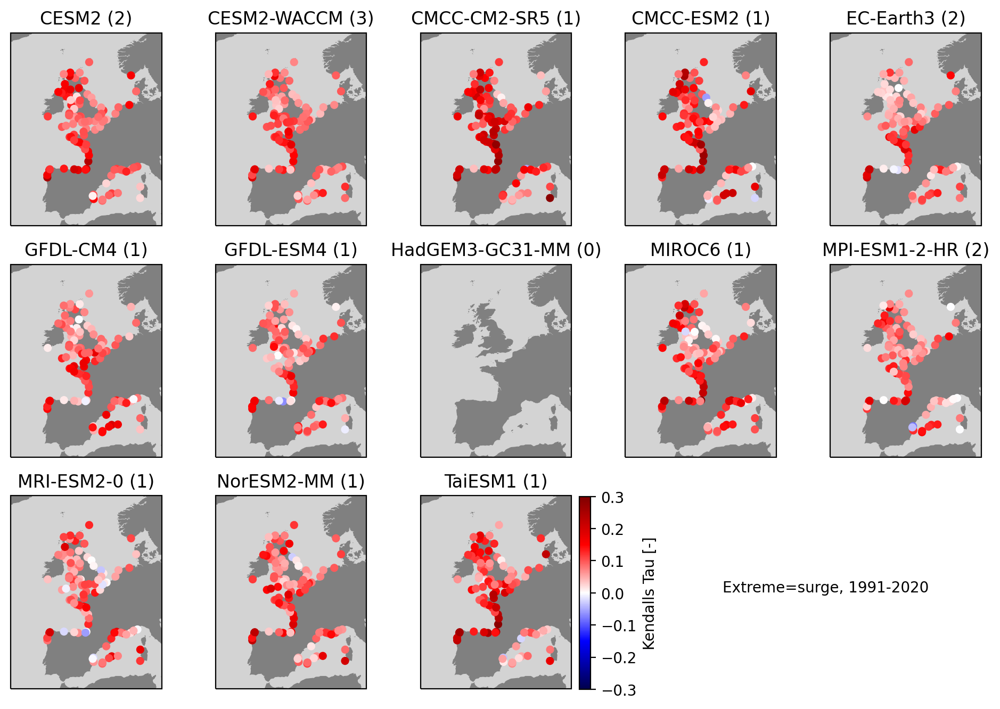

In [7]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='surge').mean(dim='member_id'),cmap='seismic',vmin=-.3,vmax=.3,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Kendalls Tau [-]')
            ax.annotate('Extreme=surge, 1991-2020',(2,.5),xycoords='axes fraction')
        

Using all data in each ssp (less easy to compare between scenarios)

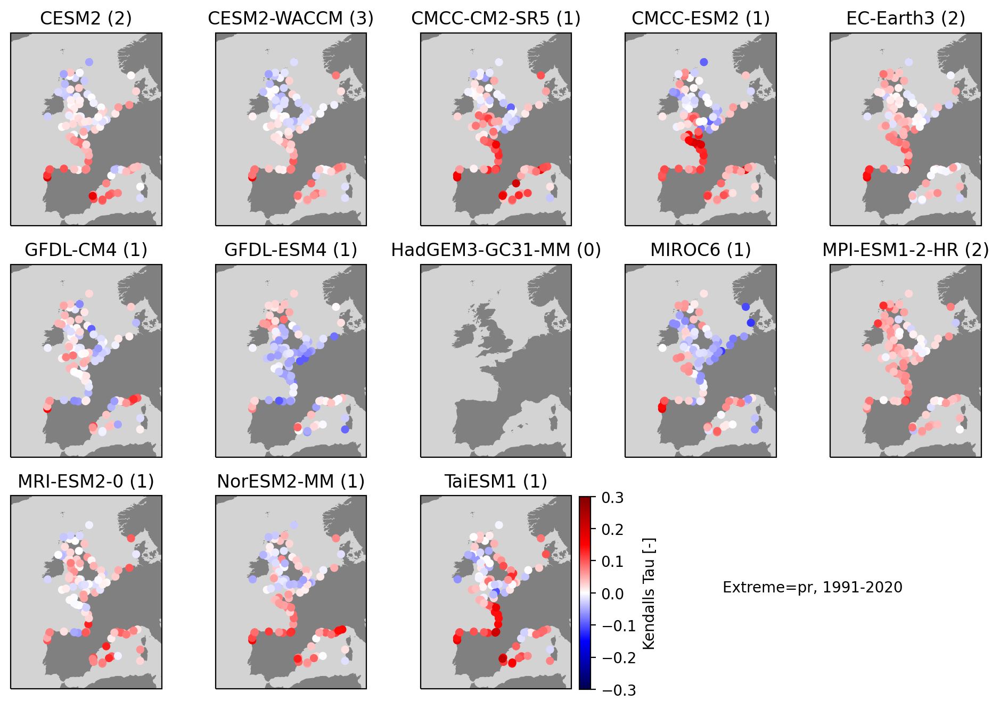

In [8]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='pr').mean(dim='member_id'),cmap='seismic',vmin=-.3,vmax=.3,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Kendalls Tau [-]')
            ax.annotate('Extreme=pr, 1991-2020',(2,.5),xycoords='axes fraction')
        

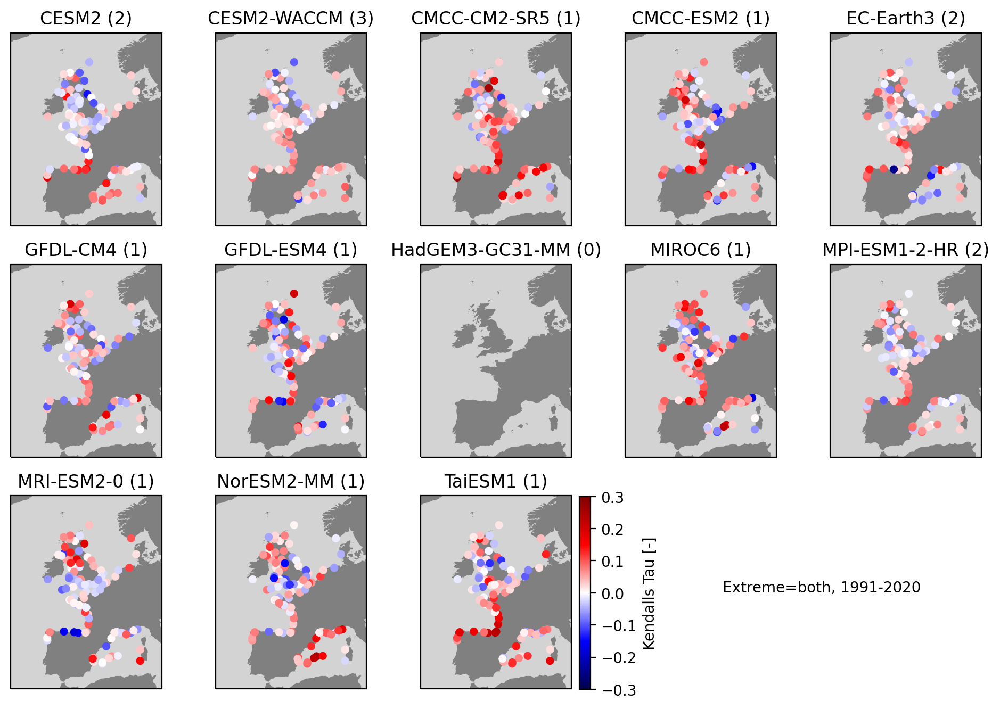

In [9]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='both').mean(dim='member_id'),cmap='seismic',vmin=-.3,vmax=.3,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Kendalls Tau [-]')
            ax.annotate('Extreme=both, 1991-2020',(2,.5),xycoords='axes fraction')
        

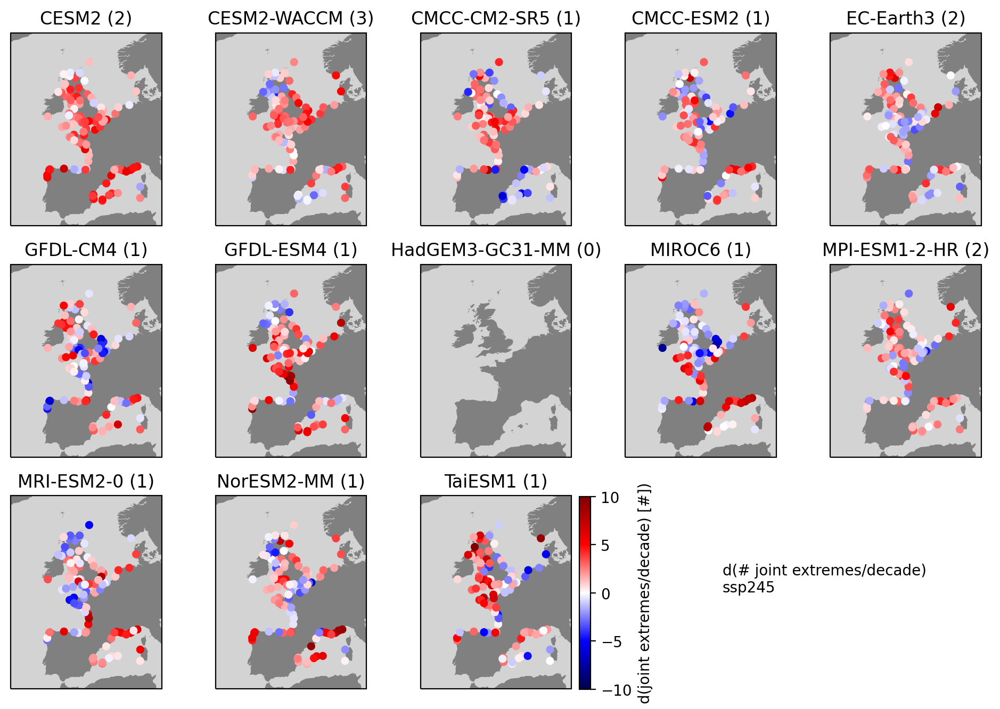

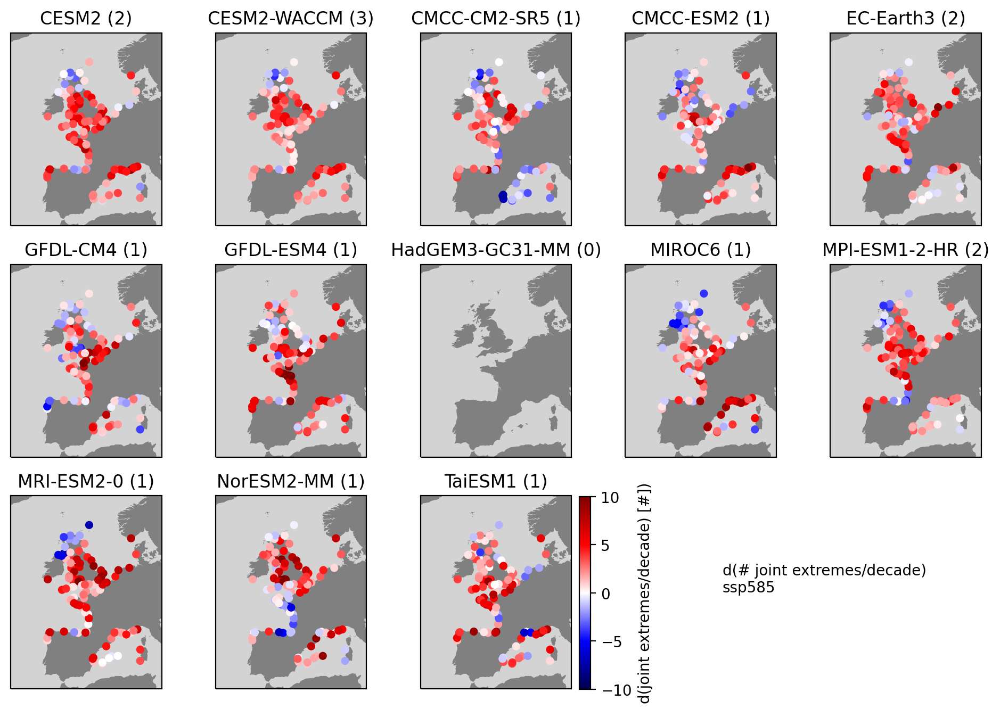

In [32]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_diff.num_co_occurring.sel(source_id=model).mean(dim='member_id'),cmap='seismic',vmin=-10,vmax=10,s=20,transform=ccrs.PlateCarree(),zorder=3)
        
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='d(joint extremes/decade) [#])')
            ax.annotate('d(# joint extremes/decade)\n'+ssp,(2,.5),xycoords='axes fraction')
        

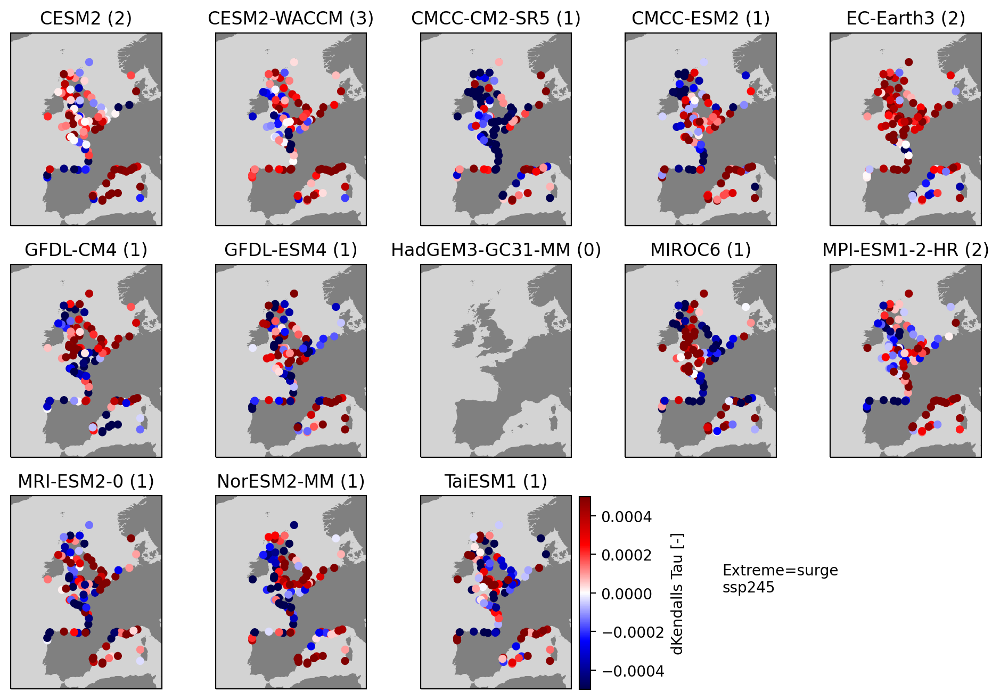

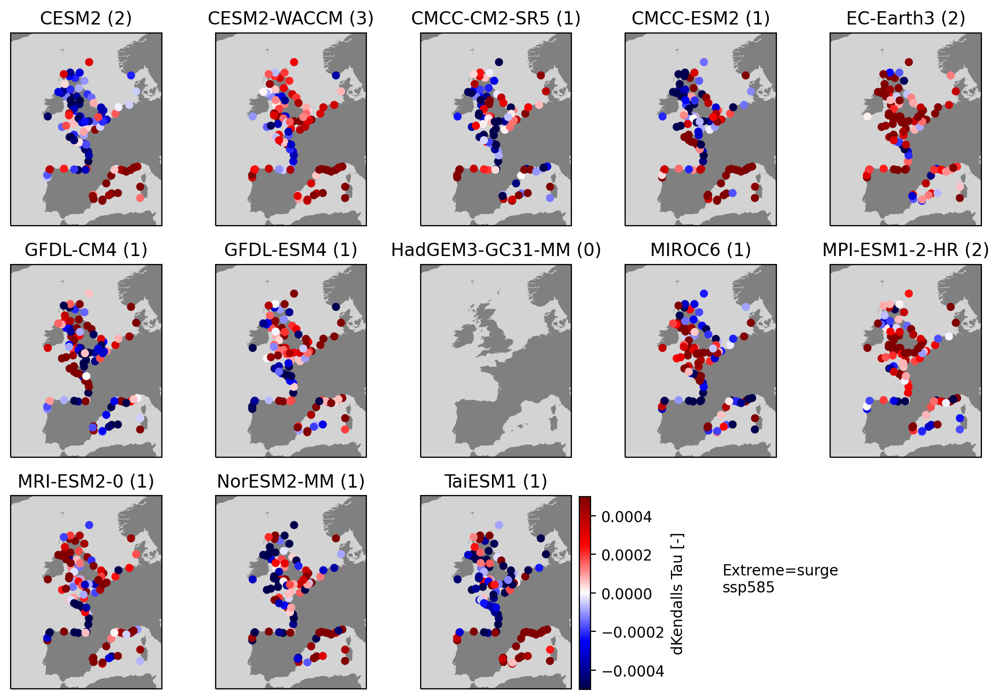

In [11]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.ktau_slope.sel(source_id=model).sel(statistic='coef',extreme_variate='surge').mean(dim='member_id'),cmap='seismic',vmin=-.0005,vmax=.0005,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dKendalls Tau [-]')
            ax.annotate('Extreme=surge\n'+ssp,(2,.5),xycoords='axes fraction')
        

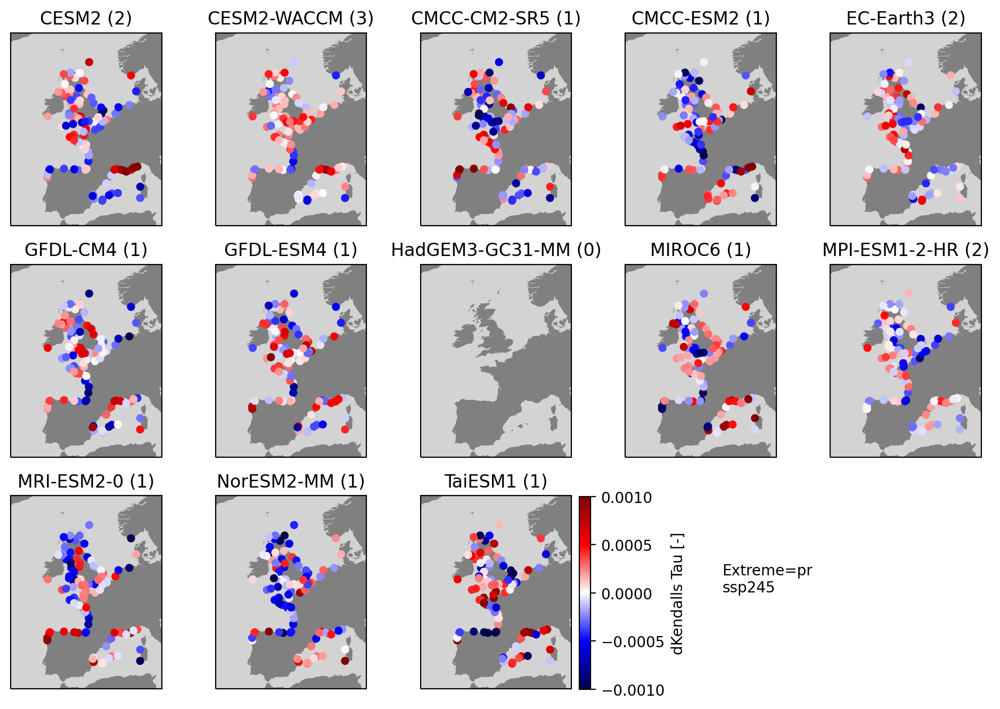

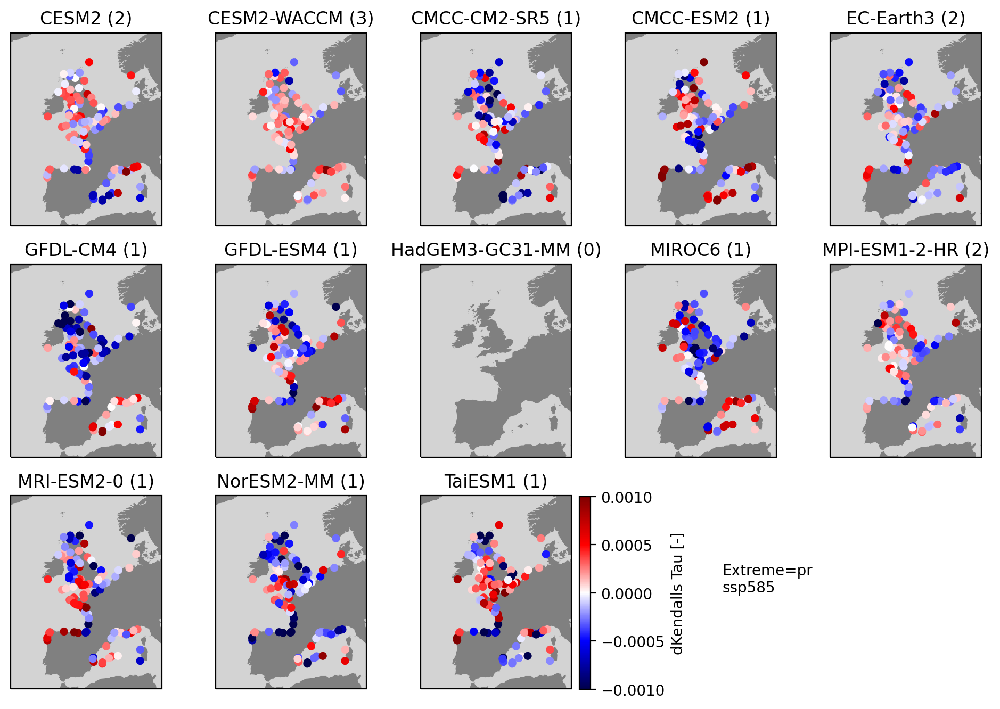

In [12]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.ktau_slope.sel(source_id=model).sel(statistic='coef',extreme_variate='pr').mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dKendalls Tau [-]')
            ax.annotate('Extreme=pr\n'+ssp,(2,.5),xycoords='axes fraction')
        

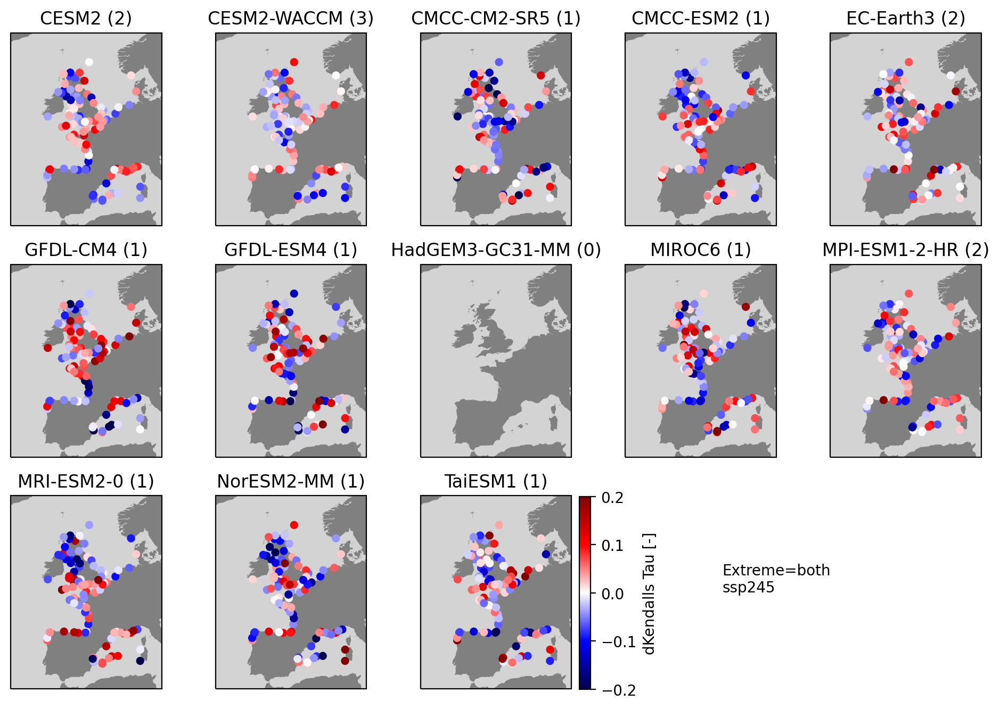

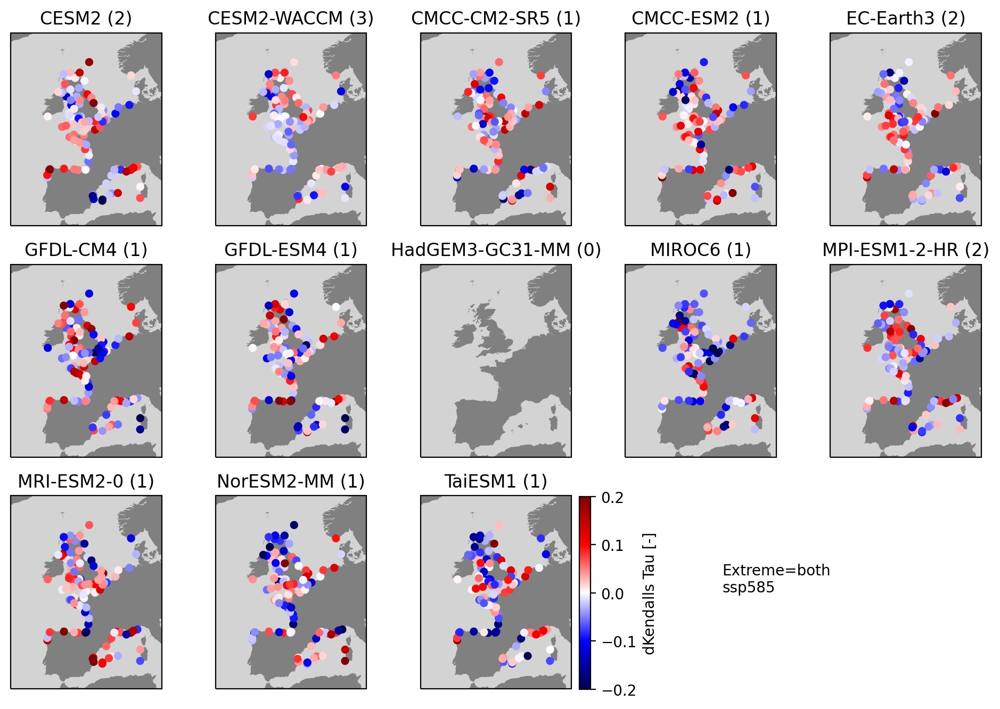

In [13]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_diff.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='both').mean(dim='member_id'),cmap='seismic',vmin=-.2,vmax=.2,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dKendalls Tau [-]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

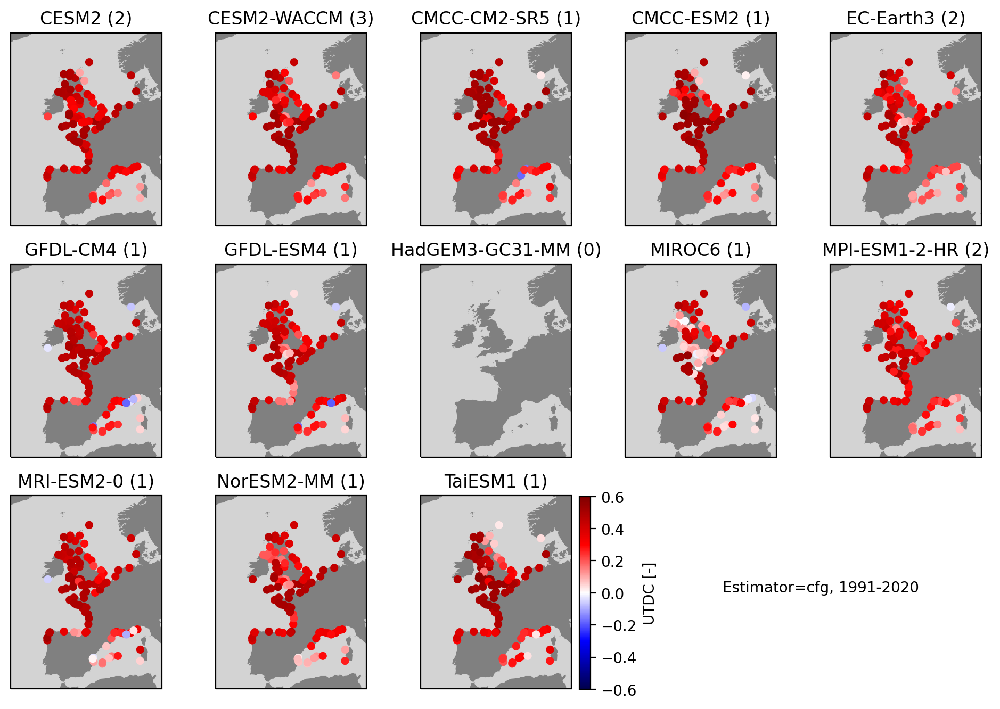

In [14]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.utdc.sel(source_id=model).sel(statistic='coef',estimator='cfg').mean(dim='member_id'),cmap='seismic',vmin=-.6,vmax=.6,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='UTDC [-]')
            ax.annotate('Estimator=cfg, 1991-2020',(2,.5),xycoords='axes fraction')
        

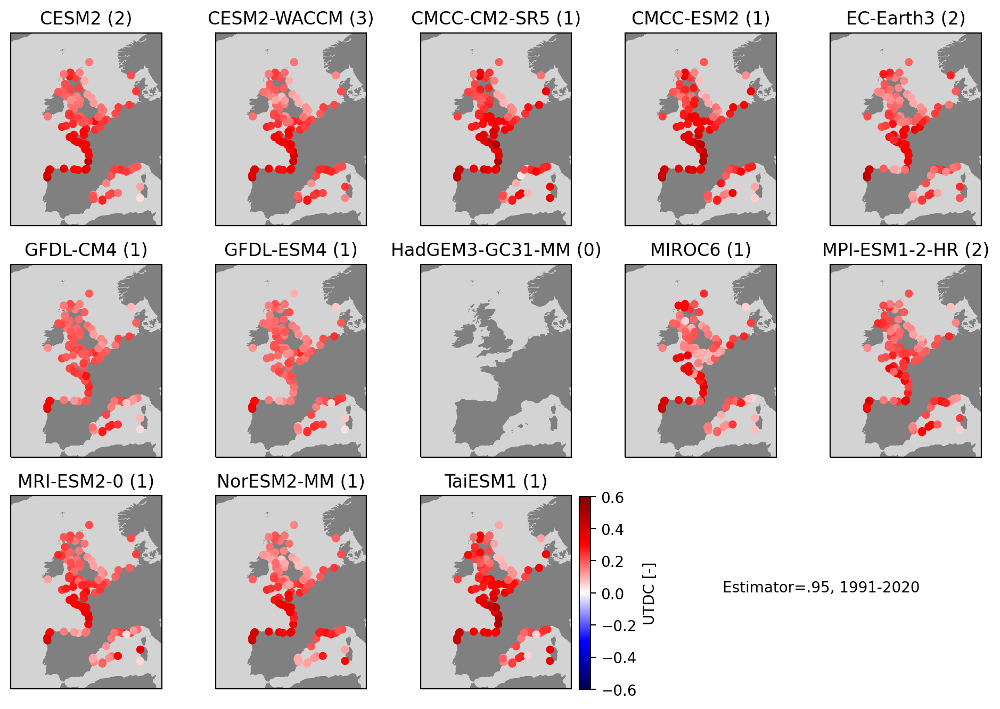

In [15]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.utdc.sel(source_id=model).sel(statistic='coef',estimator='.95').mean(dim='member_id'),cmap='seismic',vmin=-.6,vmax=.6,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='UTDC [-]')
            ax.annotate('Estimator=.95, 1991-2020',(2,.5),xycoords='axes fraction')
        

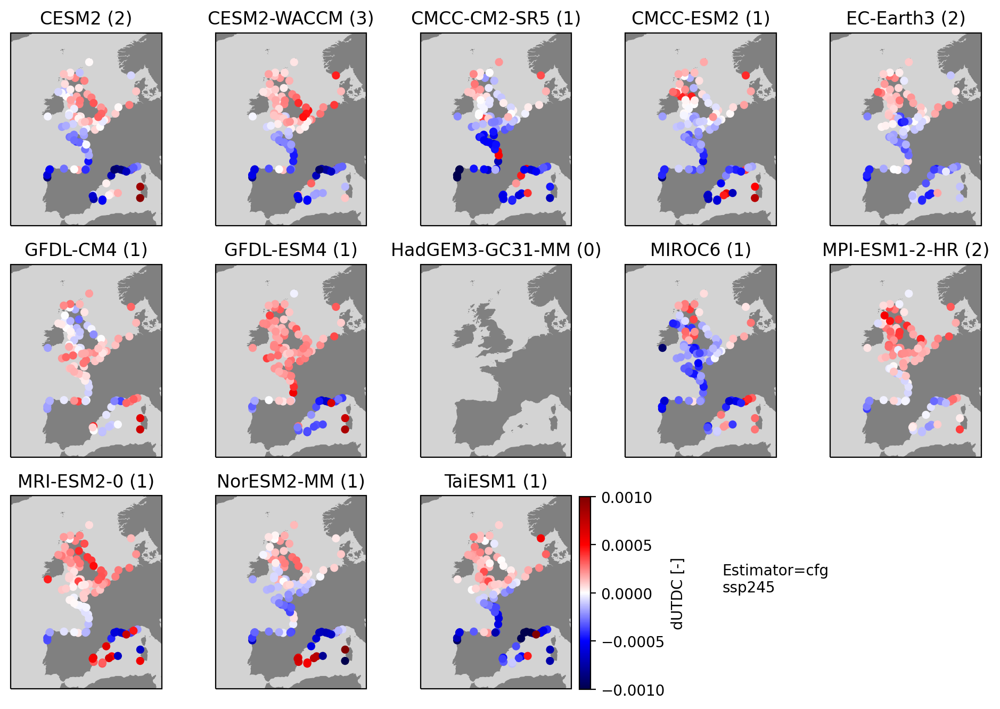

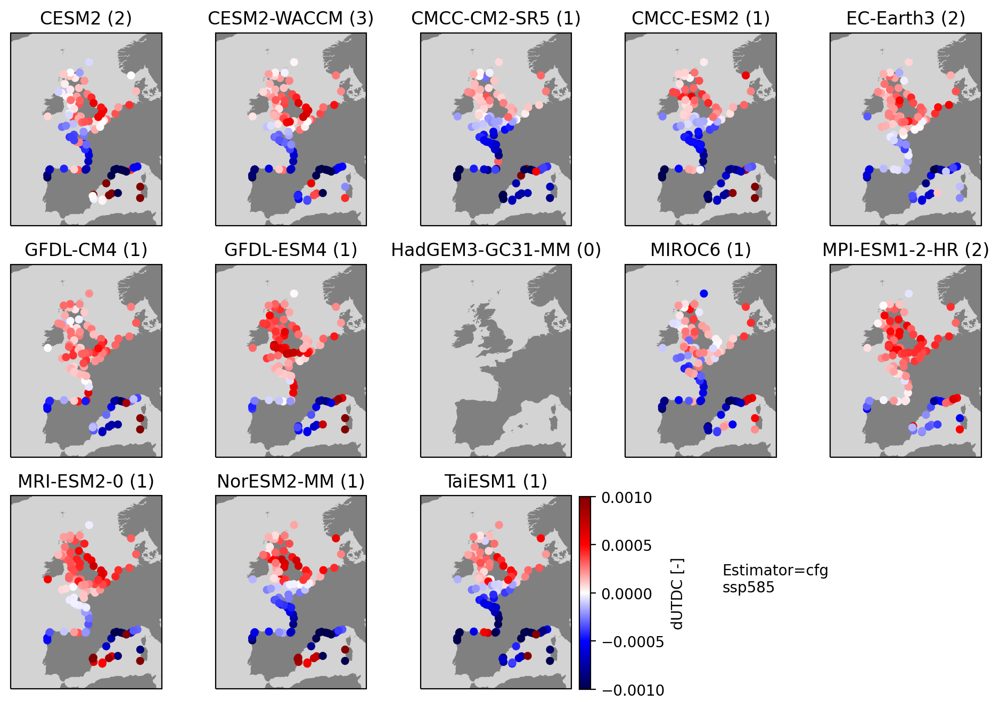

In [16]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.utdc_slope.sel(source_id=model).sel(statistic='coef',estimator='cfg').mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dUTDC [-]')
            ax.annotate('Estimator=cfg\n'+ssp,(2,.5),xycoords='axes fraction')

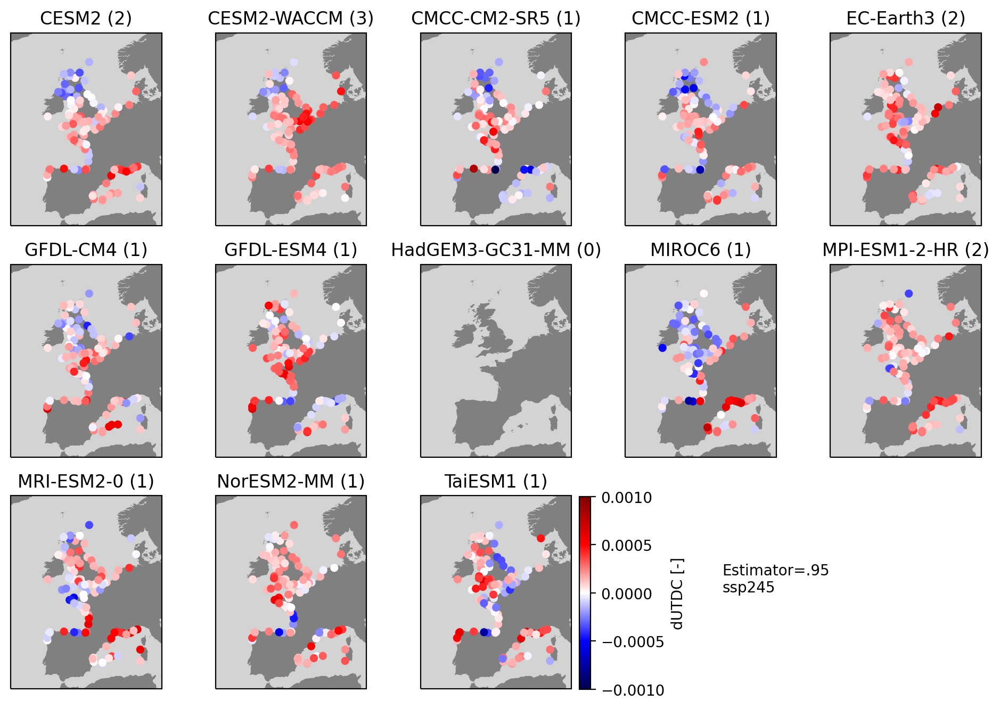

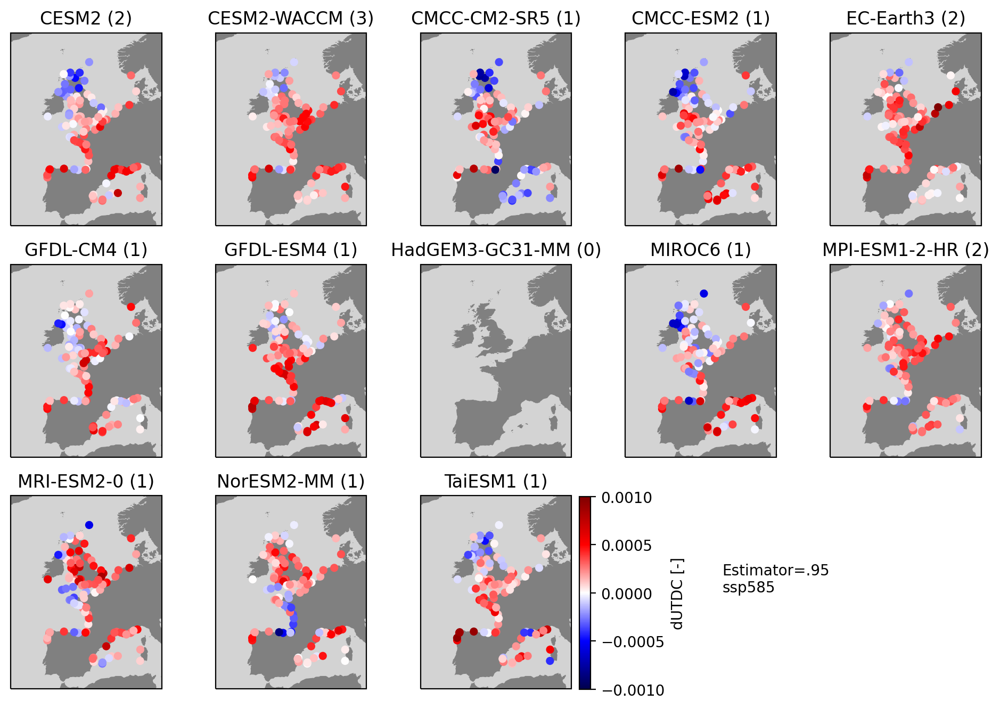

In [17]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.utdc_slope.sel(source_id=model).sel(statistic='coef',estimator='.95').mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dUTDC [-]')
            ax.annotate('Estimator=.95\n'+ssp,(2,.5),xycoords='axes fraction')

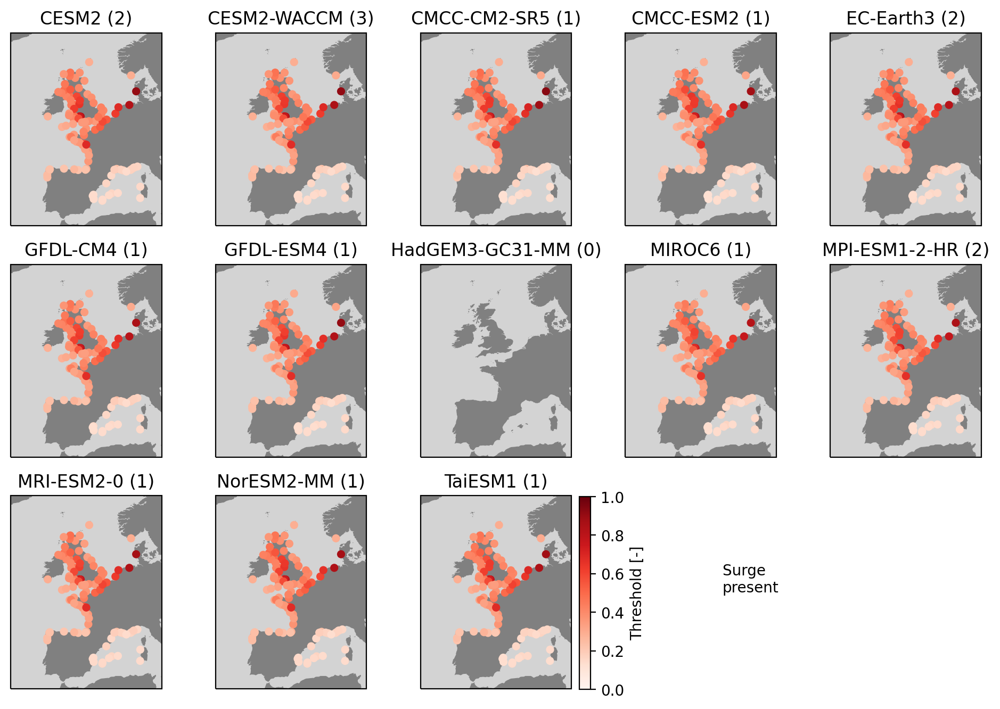

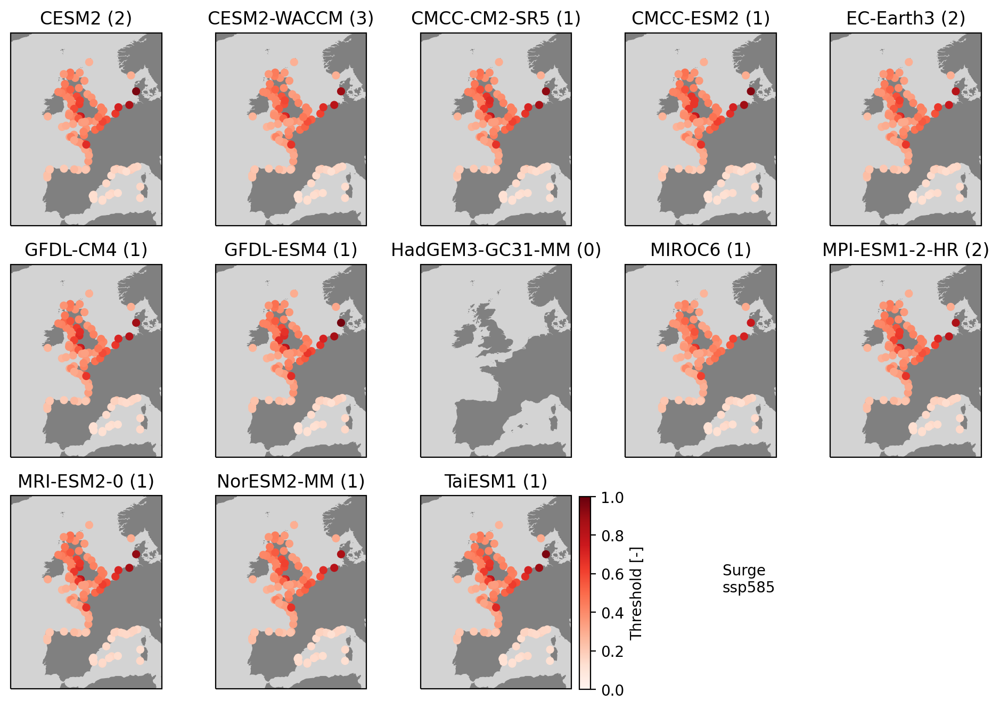

In [18]:
for s,ssp in enumerate(ssps):
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.sel(window=[2000,2080][s]).surge_thresholds.sel(source_id=model).isel(quantile=-3).mean(dim='member_id'),vmin=0,vmax=1,cmap='Reds',s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Threshold [-]')
            ax.annotate('Surge \n'+['present','ssp585'][s],(2,.5),xycoords='axes fraction')

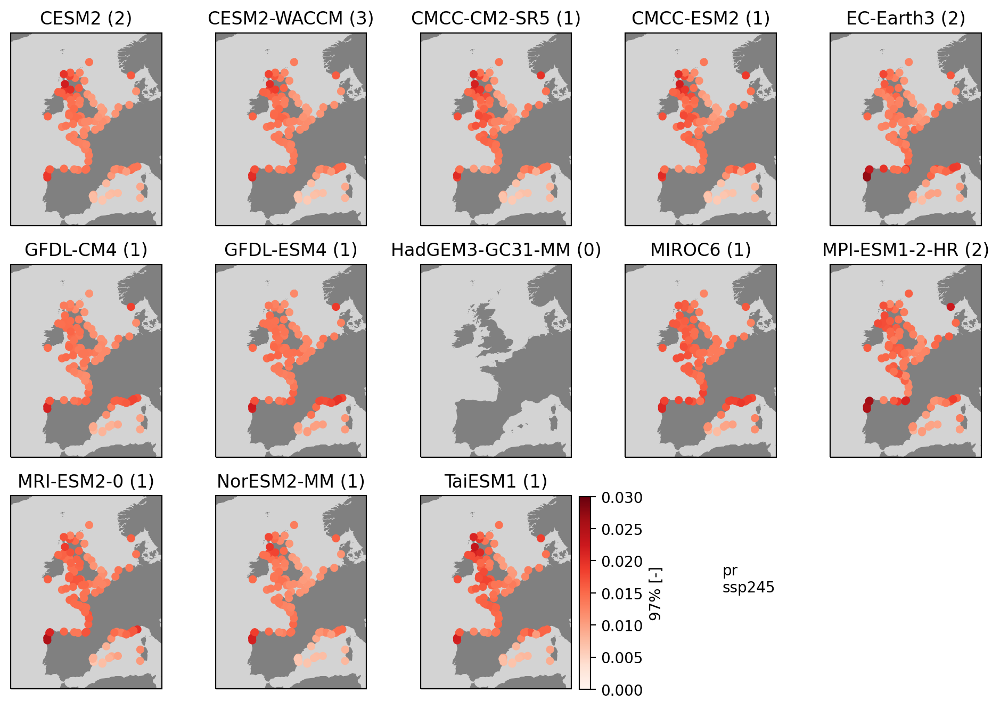

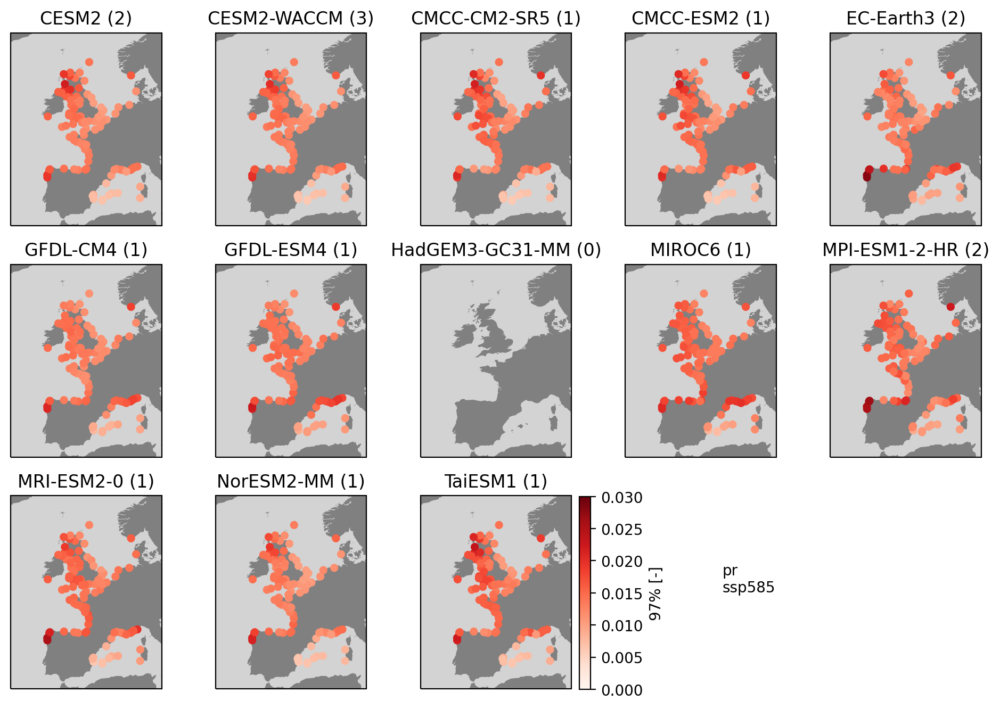

In [19]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.pr_thresholds.sel(source_id=model).isel(quantile=-3).mean(dim='member_id'),cmap='Reds',vmin=0,vmax=.03,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='97% [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')

AttributeError: 'Dataset' object has no attribute 'surge_threshold'

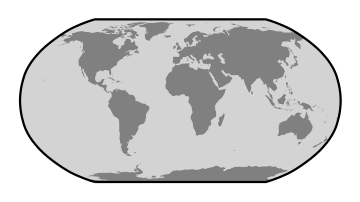

In [20]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_diff.surge_threshold.sel(source_id=model).mean(dim='member_id'),cmap='seismic',vmin=-.1,vmax=.1,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

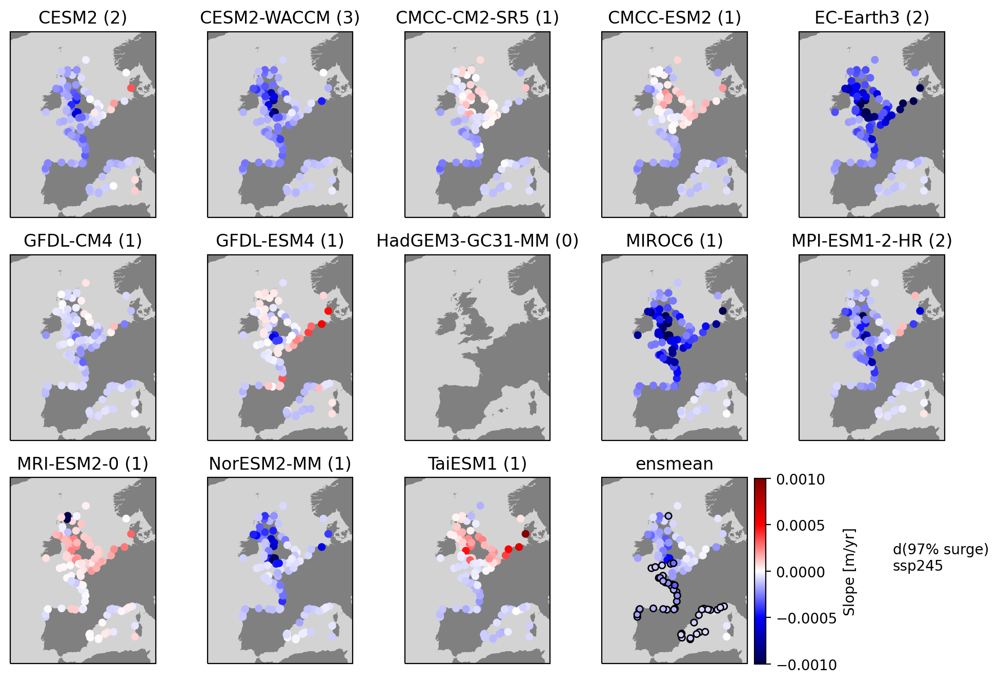

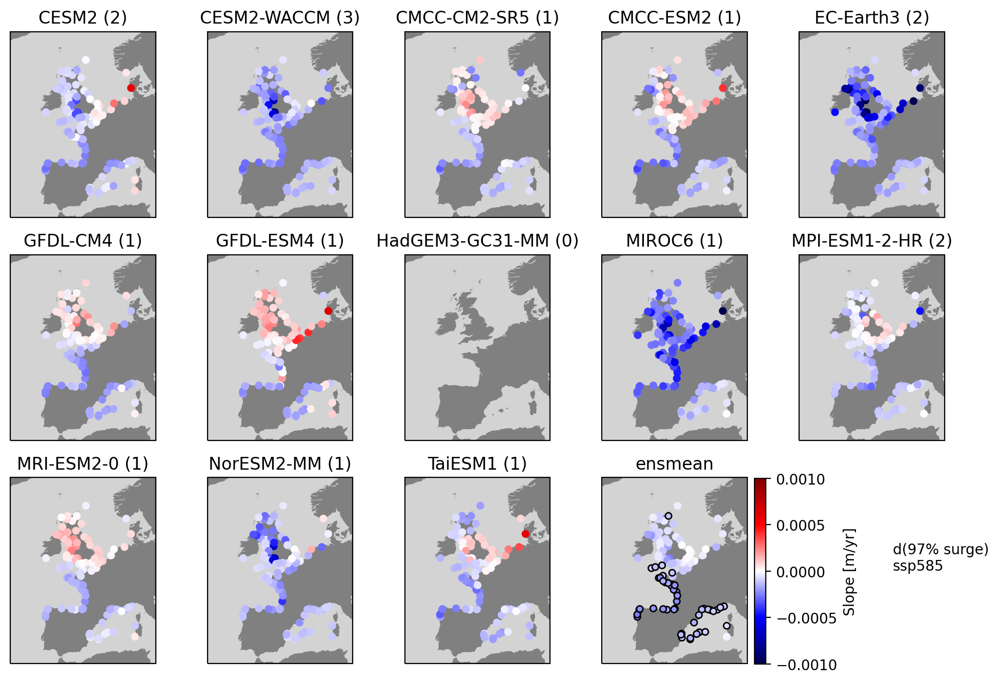

In [26]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.surge_thresholds_slope.sel(source_id=model).isel(quantile=-5).mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
            
            
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').std(dim='source_id')/ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')
    
    significant = np.abs(cv)<1
    
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')[~significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')[significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Slope [m/yr]')
    ax.annotate('d(97% surge)\n'+ssp,(2,.5),xycoords='axes fraction')

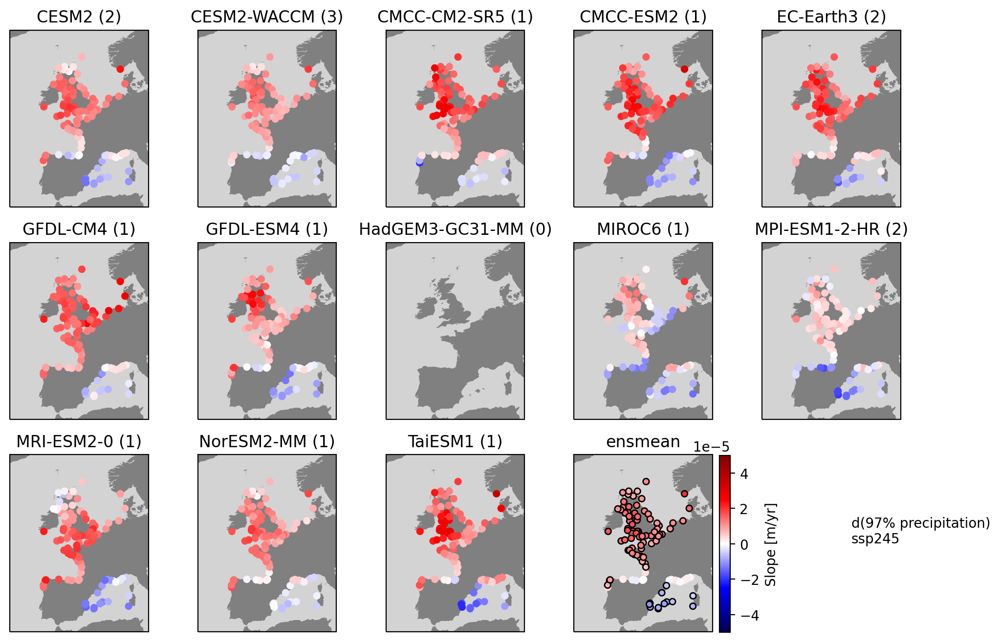

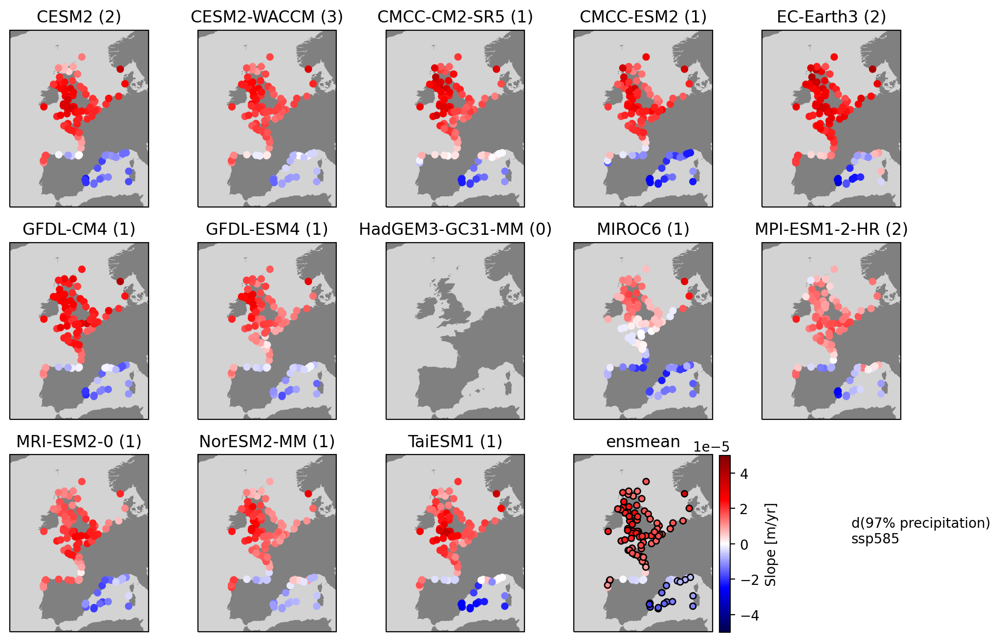

In [23]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.pr_thresholds_slope.sel(source_id=model).isel(quantile=-3).mean(dim='member_id'),cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).mean(dim='member_id').std(dim='source_id')/ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id').mean(dim='source_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id').mean(dim='source_id')[~significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id').mean(dim='source_id')[significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Slope [m/yr]')
    ax.annotate('d(97% precipitation)\n'+ssp,(2,.5),xycoords='axes fraction')

In [28]:
ssp_ds.pr_thresholds.isel(source_id=0,quantile=-3,window=-1,tg=0).mean(dim='member_id')-ssp_ds.pr_thresholds.isel(source_id=0,quantile=-3,window=0,tg=0).mean(dim='member_id')

<xarray.DataArray 'pr_thresholds' ()>
array(0.00097313)
Coordinates:
    tg            <U19 'arcachon_eyrac_.csv'
    quantile      float64 0.97
    source_id     <U15 'CESM2'
    gridcell_lat  float64 44.76
    gridcell_lon  float64 358.8
    lat           float64 44.66
    lon           float64 -1.164
    height        float64 10.0
    ssp           <U6 'ssp585'

In [29]:
ssp_ds.pr_thresholds_slope.isel(source_id=0,quantile=-3,tg=0).mean(dim='member_id')

<xarray.DataArray 'pr_thresholds_slope' ()>
array(8.3703739e-06)
Coordinates:
    tg            <U19 'arcachon_eyrac_.csv'
    quantile      float64 0.97
    source_id     <U15 'CESM2'
    gridcell_lat  float64 44.76
    gridcell_lon  float64 358.8
    lat           float64 44.66
    lon           float64 -1.164
    height        float64 10.0
    ssp           <U6 'ssp585'

Plot indivdual members of a model:

In [ ]:
model='CESM2-WACCM'
idx=np.where(np.isfinite(ds_intersect.sel(source_id=model).ktau.isel(tg=0,window=-1,statistic=0,extreme_variate=0,ssp=0)))[0]
for ssp in ssps:
    ssp_ds = ds_intersect.isel(member_id=idx).sel(ssp=ssp,source_id=model)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,member in enumerate(ssp_ds.member_id):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        
        ax.set_title(member.values)
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).std(dim='member_id')/ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[~significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

In [ ]:
model='CESM2-WACCM'
idx=np.where(np.isfinite(ds_intersect.sel(source_id=model).ktau.isel(tg=0,window=-1,statistic=0,extreme_variate=0,ssp=0)))[0]
for ssp in ssps:
    ssp_ds = ds_intersect.isel(member_id=idx).sel(ssp=ssp,source_id=model)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,member in enumerate(ssp_ds.member_id):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        
        ax.set_title(member.values)
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).std(dim='member_id')/ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[~significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

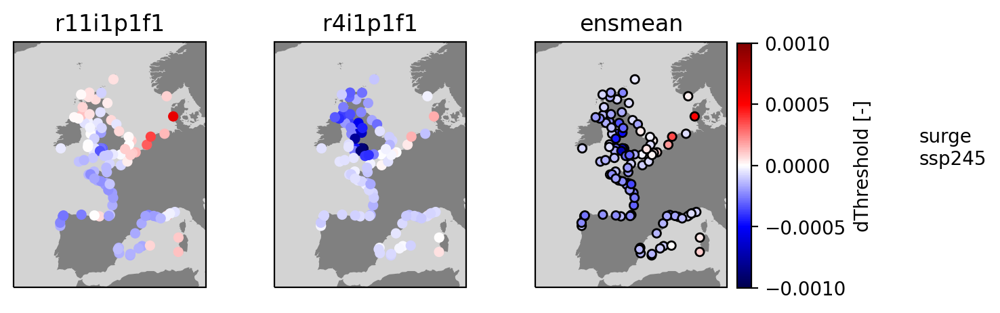

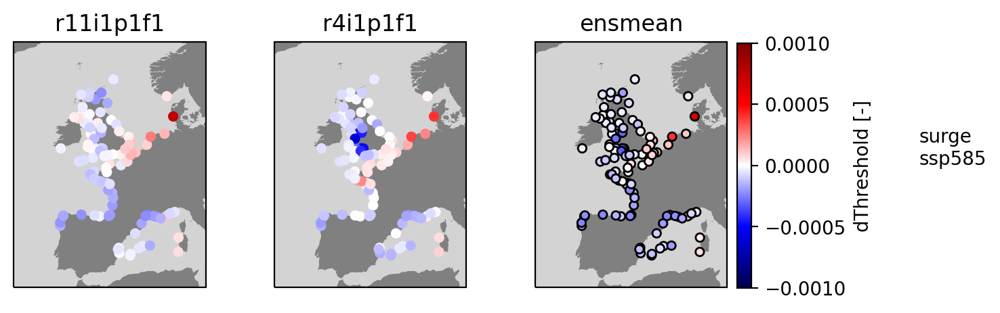

In [31]:
model='CESM2'
idx=np.where(np.isfinite(ds_intersect.sel(source_id=model).ktau.isel(tg=0,window=-1,statistic=0,extreme_variate=0,ssp=0)))[0]
for ssp in ssps:
    ssp_ds = ds_intersect.isel(member_id=idx).sel(ssp=ssp,source_id=model)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,member in enumerate(ssp_ds.member_id):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_diff.surge_thresholds.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.1,vmax=.1,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        
        ax.set_title(member.values)
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).std(dim='member_id')/ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[~significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]),)